# Part 1 - Data Loading

In [21]:
import pandas as pd
import numpy as np
import json
import ast

#### Importing steam games dataframe using readlines

In [4]:
with open('steam_games.json') as sg:
    sgpreview = sg.readlines()

In [5]:
sgpreview[0]

"{u'publisher': u'Kotoshiro', u'genres': [u'Action', u'Casual', u'Indie', u'Simulation', u'Strategy'], u'app_name': u'Lost Summoner Kitty', u'title': u'Lost Summoner Kitty', u'url': u'http://store.steampowered.com/app/761140/Lost_Summoner_Kitty/', u'release_date': u'2018-01-04', u'tags': [u'Strategy', u'Action', u'Indie', u'Casual', u'Simulation'], u'discount_price': 4.49, u'reviews_url': u'http://steamcommunity.com/app/761140/reviews/?browsefilter=mostrecent&p=1', u'specs': [u'Single-player'], u'price': 4.99, u'early_access': False, u'id': u'761140', u'developer': u'Kotoshiro'}\n"

In [6]:
ast.literal_eval(sgpreview[0])

{'publisher': 'Kotoshiro',
 'genres': ['Action', 'Casual', 'Indie', 'Simulation', 'Strategy'],
 'app_name': 'Lost Summoner Kitty',
 'title': 'Lost Summoner Kitty',
 'url': 'http://store.steampowered.com/app/761140/Lost_Summoner_Kitty/',
 'release_date': '2018-01-04',
 'tags': ['Strategy', 'Action', 'Indie', 'Casual', 'Simulation'],
 'discount_price': 4.49,
 'reviews_url': 'http://steamcommunity.com/app/761140/reviews/?browsefilter=mostrecent&p=1',
 'specs': ['Single-player'],
 'price': 4.99,
 'early_access': False,
 'id': '761140',
 'developer': 'Kotoshiro'}

In [8]:
sglist = '[' + ','.join(sgpreview) + ']'

#### Creating a dataframe

In [10]:
dfg = ast.literal_eval(sglist)

#### Saving a new JSON file

In [12]:
with open('games.json', 'w') as dfgames:
    json.dump(dfg, dfgames)

In [13]:
dfg2 = pd.read_json('games.json')
dfg2.info()
dfg2.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32135 entries, 0 to 32134
Data columns (total 16 columns):
publisher         24083 non-null object
genres            28852 non-null object
app_name          32133 non-null object
title             30085 non-null object
url               32135 non-null object
release_date      30068 non-null object
tags              31972 non-null object
discount_price    225 non-null float64
reviews_url       32133 non-null object
specs             31465 non-null object
price             30758 non-null object
early_access      32135 non-null bool
id                32133 non-null float64
developer         28836 non-null object
sentiment         24953 non-null object
metascore         2677 non-null object
dtypes: bool(1), float64(2), object(13)
memory usage: 3.7+ MB


,publisher,genres,app_name,title,url,release_date,tags,discount_price,reviews_url,specs,price,early_access,id,developer,sentiment,metascore
0,Kotoshiro,"[Action, Casual, Indie, Simulation, Strategy]",Lost Summoner Kitty,Lost Summoner Kitty,http://store.steampowered.com/app/761140/Lost_...,2018-01-04,"[Strategy, Action, Indie, Casual, Simulation]",4.49,http://steamcommunity.com/app/761140/reviews/?...,[Single-player],4.99,False,761140.0,Kotoshiro,NaN,NaN
1,"Making Fun, Inc.","[Free to Play, Indie, RPG, Strategy]",Ironbound,Ironbound,http://store.steampowered.com/app/643980/Ironb...,2018-01-04,"[Free to Play, Strategy, Indie, RPG, Card Game...",NaN,http://steamcommunity.com/app/643980/reviews/?...,"[Single-player, Multi-player, Online Multi-Pla...",Free To Play,False,643980.0,Secret Level SRL,Mostly Positive,NaN
2,Poolians.com,"[Casual, Free to Play, Indie, Simulation, Sports]",Real Pool 3D - Poolians,Real Pool 3D - Poolians,http://store.steampowered.com/app/670290/Real_...,2017-07-24,"[Free to Play, Simulation, Sports, Casual, Ind...",NaN,http://steamcommunity.com/app/670290/reviews/?...,"[Single-player, Multi-player, Online Multi-Pla...",Free to Play,False,670290.0,Poolians.com,Mostly Positive,NaN
3,彼岸领域,"[Action, Adventure, Casual]",弹炸人2222,弹炸人2222,http://store.steampowered.com/app/767400/2222/,2017-12-07,"[Action, Adventure, Casual]",0.83,http://steamcommunity.com/app/767400/reviews/?...,[Single-player],0.99,False,767400.0,彼岸领域,NaN,NaN
4,NaN,NaN,Log Challenge,NaN,http://store.steampowered.com/app/773570/Log_C...,NaN,"[Action, Indie, Casual, Sports]",1.79,http://steamcommunity.com/app/773570/reviews/?...,"[Single-player, Full controller support, HTC V...",2.99,False,773570.0,NaN,NaN,NaN


#### Converting JSON to CSV

In [14]:
dfg2.to_csv('steam_games.csv')

# Part 2 - Data Pre-processing and Exploration

In [350]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
color = sns.color_palette()
from collections import Counter

#### Importing the new CSV

In [174]:
dfg3 = pd.read_csv('steam_games.csv', index_col = 0)
dfg3.head()

,publisher,genres,app_name,title,url,release_date,tags,discount_price,reviews_url,specs,price,early_access,id,developer,sentiment,metascore
0,Kotoshiro,"['Action', 'Casual', 'Indie', 'Simulation', 'S...",Lost Summoner Kitty,Lost Summoner Kitty,http://store.steampowered.com/app/761140/Lost_...,2018-01-04,"['Strategy', 'Action', 'Indie', 'Casual', 'Sim...",4.49,http://steamcommunity.com/app/761140/reviews/?...,['Single-player'],4.99,False,761140.0,Kotoshiro,NaN,NaN
1,"Making Fun, Inc.","['Free to Play', 'Indie', 'RPG', 'Strategy']",Ironbound,Ironbound,http://store.steampowered.com/app/643980/Ironb...,2018-01-04,"['Free to Play', 'Strategy', 'Indie', 'RPG', '...",NaN,http://steamcommunity.com/app/643980/reviews/?...,"['Single-player', 'Multi-player', 'Online Mult...",Free To Play,False,643980.0,Secret Level SRL,Mostly Positive,NaN
2,Poolians.com,"['Casual', 'Free to Play', 'Indie', 'Simulatio...",Real Pool 3D - Poolians,Real Pool 3D - Poolians,http://store.steampowered.com/app/670290/Real_...,2017-07-24,"['Free to Play', 'Simulation', 'Sports', 'Casu...",NaN,http://steamcommunity.com/app/670290/reviews/?...,"['Single-player', 'Multi-player', 'Online Mult...",Free to Play,False,670290.0,Poolians.com,Mostly Positive,NaN
3,彼岸领域,"['Action', 'Adventure', 'Casual']",弹炸人2222,弹炸人2222,http://store.steampowered.com/app/767400/2222/,2017-12-07,"['Action', 'Adventure', 'Casual']",0.83,http://steamcommunity.com/app/767400/reviews/?...,['Single-player'],0.99,False,767400.0,彼岸领域,NaN,NaN
4,NaN,NaN,Log Challenge,NaN,http://store.steampowered.com/app/773570/Log_C...,NaN,"['Action', 'Indie', 'Casual', 'Sports']",1.79,http://steamcommunity.com/app/773570/reviews/?...,"['Single-player', 'Full controller support', '...",2.99,False,773570.0,NaN,NaN,NaN


#### Removing all entries with no date

In [34]:
dfgdate = dfg3[dfg3['release_date'].notnull()]

In [35]:
dfgdate['release_date'].describe()

count          30068
unique          3582
top       2012-10-16
freq             100
Name: release_date, dtype: object

In [36]:
# Replace field with 'None' if third element is '-'
dfgdate['release_date'] = dfgdate['release_date'].map(lambda x : x if x[-3] == '-' else None)

In [37]:
dfgdate = dfgdate[dfgdate['release_date'].notnull()]

#### Convert all entries to datetime

In [38]:
dfgdate['release_date'] = pd.to_datetime(dfgdate['release_date'])

In [39]:
dfgdate['release_date'].describe()

count                   29783
unique                   3457
top       2012-10-16 00:00:00
freq                      100
first     1970-07-15 00:00:00
last      2021-12-31 00:00:00
Name: release_date, dtype: object

#### Plotting number of game releases by year

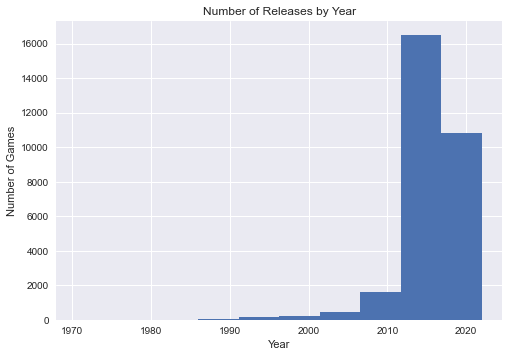

In [358]:
dfgdate['release_date'].hist()
plt.title("Number of Releases by Year")
plt.ylabel("Number of Games")
plt.xlabel("Year")
plt.style.use("seaborn")
plt.savefig('Image01-GamesPerYear1.pdf')
plt.show()

#### Plotting number of game releases since 2010

In [325]:
dfgdate2 = dfgdate[dfgdate['release_date'].dt.year > 2010]

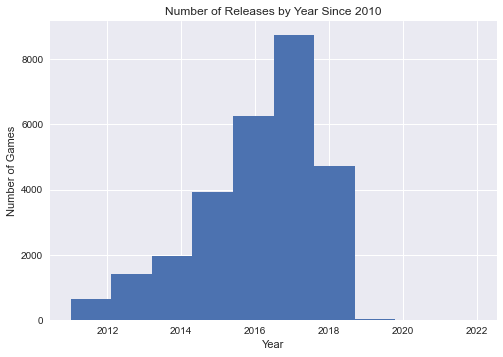

In [359]:
dfgdate2['release_date'].hist()
plt.title("Number of Releases by Year Since 2010")
plt.ylabel("Number of Games")
plt.xlabel("Year")
plt.style.use("seaborn")
plt.savefig('Image02-GamesPerYear2.pdf')
plt.show()

#### Plotting number of game releases by month

In [57]:
dfgdate2['release_month'] = dfgdate2['release_date'].dt.month

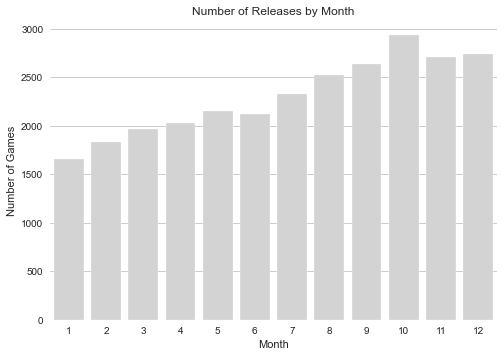

In [360]:
recolor1 = {release_month: "lightgrey" for release_month in dfgdate2['release_month'].unique()}
with sns.axes_style("whitegrid"):
    sns.countplot(x = dfgdate2['release_month'], palette = recolor1)
plt.title('Number of Releases by Month')
plt.ylabel('Number of Games')
plt.xlabel('Month')
plt.savefig('Image03-GamesPerMonth.pdf')
plt.show()

In [ ]:
#recolor2

In [175]:
dfgprice = dfg3

In [176]:
dfgprice['price'].describe()

count     30758
unique      162
top        4.99
freq       4278
Name: price, dtype: object

#### Replace all string in column price with 0 (example string: "Free to Play", "Install Now", etc.)

In [179]:
dfgdate['release_date'] = dfgdate['release_date'].map(lambda x : x if (type(x) != str) else "0")

In [180]:
dfgprice.head()

,publisher,genres,app_name,title,url,release_date,tags,discount_price,reviews_url,specs,price,early_access,id,developer,sentiment,metascore
0,Kotoshiro,"['Action', 'Casual', 'Indie', 'Simulation', 'S...",Lost Summoner Kitty,Lost Summoner Kitty,http://store.steampowered.com/app/761140/Lost_...,2018-01-04,"['Strategy', 'Action', 'Indie', 'Casual', 'Sim...",4.49,http://steamcommunity.com/app/761140/reviews/?...,['Single-player'],4.99,False,761140.0,Kotoshiro,NaN,NaN
1,"Making Fun, Inc.","['Free to Play', 'Indie', 'RPG', 'Strategy']",Ironbound,Ironbound,http://store.steampowered.com/app/643980/Ironb...,2018-01-04,"['Free to Play', 'Strategy', 'Indie', 'RPG', '...",NaN,http://steamcommunity.com/app/643980/reviews/?...,"['Single-player', 'Multi-player', 'Online Mult...",0,False,643980.0,Secret Level SRL,Mostly Positive,NaN
2,Poolians.com,"['Casual', 'Free to Play', 'Indie', 'Simulatio...",Real Pool 3D - Poolians,Real Pool 3D - Poolians,http://store.steampowered.com/app/670290/Real_...,2017-07-24,"['Free to Play', 'Simulation', 'Sports', 'Casu...",NaN,http://steamcommunity.com/app/670290/reviews/?...,"['Single-player', 'Multi-player', 'Online Mult...",0,False,670290.0,Poolians.com,Mostly Positive,NaN
3,彼岸领域,"['Action', 'Adventure', 'Casual']",弹炸人2222,弹炸人2222,http://store.steampowered.com/app/767400/2222/,2017-12-07,"['Action', 'Adventure', 'Casual']",0.83,http://steamcommunity.com/app/767400/reviews/?...,['Single-player'],0.99,False,767400.0,彼岸领域,NaN,NaN
4,NaN,NaN,Log Challenge,NaN,http://store.steampowered.com/app/773570/Log_C...,NaN,"['Action', 'Indie', 'Casual', 'Sports']",1.79,http://steamcommunity.com/app/773570/reviews/?...,"['Single-player', 'Full controller support', '...",2.99,False,773570.0,NaN,NaN,NaN


#### Convert all entries to float

In [181]:
dfgprice['price'] = dfgprice['price'].astype(float)

In [182]:
dfgprice['price'].describe()

count    30758.000000
mean         8.866855
std         15.903457
min          0.000000
25%          2.990000
50%          4.990000
75%          9.990000
max        995.000000
Name: price, dtype: float64

#### Plotting prices of all games

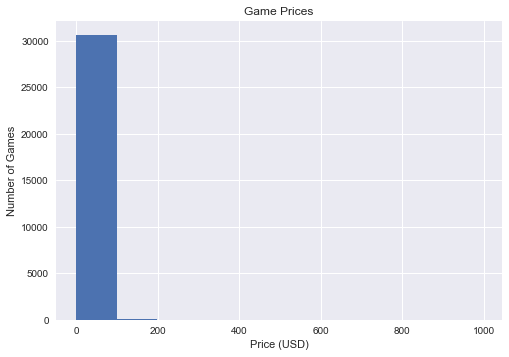

In [361]:
dfgprice['price'].hist()
plt.title('Game Prices')
plt.xlabel('Price (USD)')
plt.ylabel('Number of Games')
plt.style.use('seaborn')
plt.savefig('Image04-GamePrices1.pdf')
plt.show()

#### Plotting prices of games below 60 USD

In [193]:
#dfgprice2 = dfgprice[dfgprice['price'] < 200]
#dfgprice2 = dfgprice[dfgprice['price'] < 100]
dfgprice2 = dfgprice[dfgprice['price'] < 60]

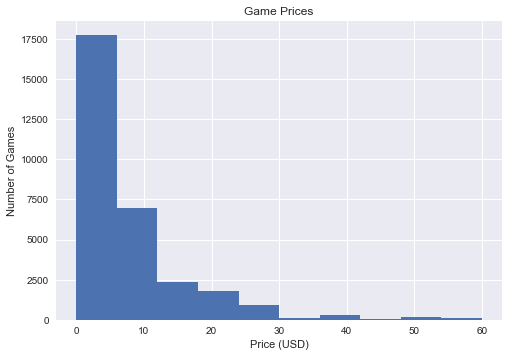

In [362]:
dfgprice2['price'].hist()
plt.title('Game Prices')
plt.xlabel('Price (USD)')
plt.ylabel('Number of Games')
plt.style.use('seaborn')
plt.savefig('Image05-GamePrices2.pdf')
plt.show()

#### Plotting discounted prices of games

In [300]:
dfgdiscount = dfg3

In [302]:
dfgdiscount = dfgdiscount[dfgdiscount['discount_price'].notnull()]

In [305]:
dfgdiscount['discount_price'].describe()

count    225.000000
mean      11.930533
std       17.492643
min        0.490000
25%        1.390000
50%        4.190000
75%       22.660000
max      139.990000
Name: discount_price, dtype: float64

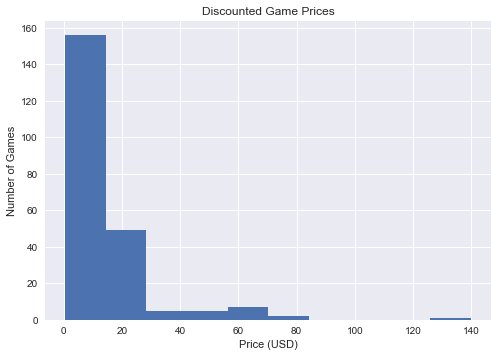

In [363]:
dfgdiscount['discount_price'].hist()
plt.title('Discounted Game Prices')
plt.xlabel('Price (USD)')
plt.ylabel('Number of Games')
plt.style.use('seaborn')
plt.savefig('Image06-DiscountedGamePrices1.pdf')
plt.show()

#### Plotting discounted prices of games below 60 USD

In [308]:
dfgdiscount2 = dfgdiscount[dfgdiscount['discount_price'] < 60]

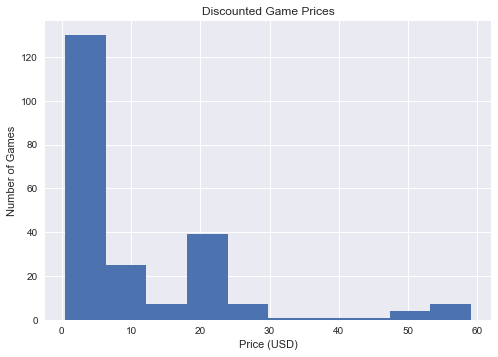

In [364]:
dfgdiscount2['discount_price'].hist()
plt.title('Discounted Game Prices')
plt.xlabel('Price (USD)')
plt.ylabel('Number of Games')
plt.style.use('seaborn')
plt.savefig('Image07-DiscountedGamePrices2.pdf')
plt.show()

#### Removing all entries with no genre

In [233]:
dfggenre = dfg3

In [234]:
dfggenre = dfggenre[dfggenre['genres'].notnull()]

#### Collating genre of each entry into a list

In [235]:
genres = list(dfggenre['genres'].unique())

In [236]:
genres[0]

"['Action', 'Casual', 'Indie', 'Simulation', 'Strategy']"

#### Removing all punctuation

In [237]:
genrefuse = ','.join(genres)

In [238]:
genrefuse = genrefuse.replace("[","")
genrefuse = genrefuse.replace("]","")
genrefuse = genrefuse.replace("'","")
genrefuse = genrefuse.replace(" ","")

#### Splitting the genres and using set method to get all unique entries

In [239]:
genresplit = genrefuse.split(',')

In [240]:
genrelist = set(genresplit)
genrelist

{'Accounting',
 'Action',
 'Adventure',
 'Animation&amp;Modeling',
 'AudioProduction',
 'Casual',
 'Design&amp;Illustration',
 'EarlyAccess',
 'Education',
 'FreetoPlay',
 'Indie',
 'MassivelyMultiplayer',
 'PhotoEditing',
 'RPG',
 'Racing',
 'Simulation',
 'SoftwareTraining',
 'Sports',
 'Strategy',
 'Utilities',
 'VideoProduction',
 'WebPublishing'}

#### Creating a column for each genre type

In [241]:
for genre in genrelist:
    dfggenre[genre] = 0

In [242]:
dfggenre['genres'] = dfggenre['genres'].map(lambda x : x.replace("[",""))
dfggenre['genres'] = dfggenre['genres'].map(lambda x : x.replace("]",""))
dfggenre['genres'] = dfggenre['genres'].map(lambda x : x.replace("'",""))
dfggenre['genres'] = dfggenre['genres'].map(lambda x : x.replace(" ",""))

In [243]:
dfggenre['genres'] = dfggenre['genres'].map(lambda x : x.split(','))

#### Replace value in each genre column with 1 if genre is applicable to that game

In [246]:
for index, genres in enumerate(dfggenre['genres']):
    for genre in genres:
        dfggenre.loc[index, genre] = 1

In [251]:
dfggenre.columns

Index(['publisher', 'genres', 'app_name', 'title', 'url', 'release_date',
       'tags', 'discount_price', 'reviews_url', 'specs', 'price',
       'early_access', 'id', 'developer', 'sentiment', 'metascore', 'Action',
       'Sports', 'Utilities', 'Animation&amp;Modeling', 'VideoProduction',
       'AudioProduction', 'Education', 'PhotoEditing', 'Strategy',
       'Simulation', 'Casual', 'FreetoPlay', 'WebPublishing', 'Adventure',
       'Indie', 'RPG', 'EarlyAccess', 'SoftwareTraining',
       'MassivelyMultiplayer', 'Design&amp;Illustration', 'Racing',
       'Accounting'],
      dtype='object')

#### Creating a dictionary for count of all genres

In [250]:
genredict = {}

In [252]:
genrecolumns = dfggenre.loc[:, 'Action':'Accounting'].columns

In [253]:
for column in genrecolumns:
    genredict[column] = dfggenre[column].sum()

In [254]:
genredictsort = {keys: values for keys, values in \
                sorted(genredict.items(), key = lambda item : item[1], reverse=True)}

In [264]:
genredictsortkey = list(genredictsort.keys())
genredictsortvalue = list(genredictsort.values())

#### Plotting the number of games for each genre

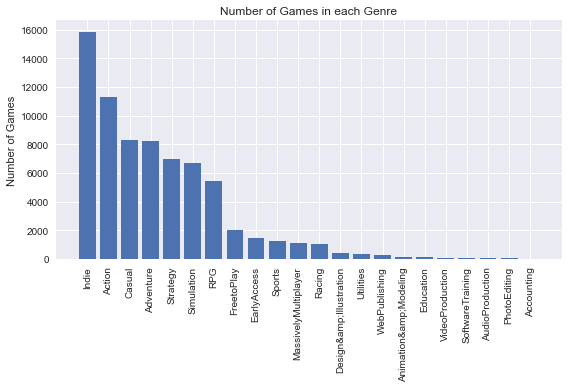

In [382]:
plt.bar(range(len(genredictsort)), genredictsortvalue, tick_label=genredictsortkey)
plt.title("Number of Games in each Genre")
plt.ylabel("Number of Games")
plt.xticks(rotation=90)
plt.style.use("seaborn")
plt.tight_layout()
plt.savefig('Image08-GamesByGenre1.pdf')
plt.show()

#### Creating a dictionary for top developers by number of releases

In [269]:
dfgdev = dfg3

In [270]:
dfgdev = dfgdev[dfgdev['developer'].notnull()]

In [271]:
developers = {}

In [272]:
for developer in list(dfgdev['developer']):
    if not developer in developers:
        developers[developer] = 1
    else:
        developers[developer] += 1

In [386]:
topdevs = dict(Counter(developers).most_common(10))

In [387]:
topdevskey = list(topdevs.keys())
topdevsvalue = list(topdevs.values())

#### Plotting top 10 developers with most releases

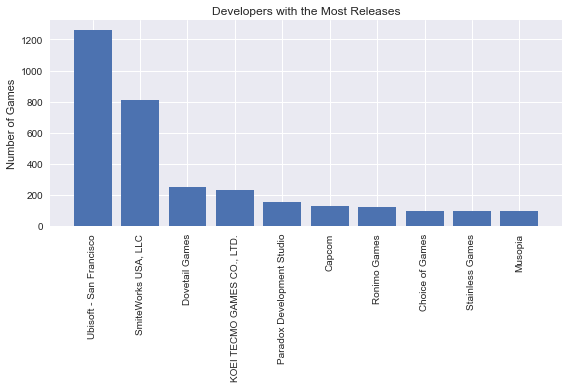

In [388]:
plt.bar(range(len(topdevs)), topdevsvalue, tick_label=topdevskey)
plt.title("Developers with the Most Releases")
plt.ylabel("Number of Games")
plt.xticks(rotation=90)
plt.style.use("seaborn")
plt.tight_layout()
plt.savefig('Image08-GamesByDeveloper2.pdf')
plt.show()

## Part 3 - Sentiment Analysis

#### Importing Steam Reviews Dataframe

In [5]:
import pandas as pd
pd.options.mode.chained_assignment = None
import numpy as np

dfr = pd.read_csv("steam_reviews.csv")

#Change to Str as some reviews are text such as "9/10" which gives float error
dfr["review"] = dfr["review"].astype(str)

dfr.head()

,date_posted,funny,helpful,hour_played,is_early_access_review,recommendation,review,title
0,2019-02-10,2,4,578,False,Recommended,&gt Played as German Reich&gt Declare war on B...,Expansion - Hearts of Iron IV: Man the Guns
1,2019-02-10,0,0,184,False,Recommended,yes.,Expansion - Hearts of Iron IV: Man the Guns
2,2019-02-07,0,0,892,False,Recommended,Very good game although a bit overpriced in my...,Expansion - Hearts of Iron IV: Man the Guns
3,2018-06-14,126,1086,676,False,Recommended,Out of all the reviews I wrote This one is pro...,Dead by Daylight
4,2017-06-20,85,2139,612,False,Recommended,Disclaimer I survivor main. I play games for f...,Dead by Daylight


#### Importing Matplotlib and Plotly

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
color = sns.color_palette()
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.express as px
py.init_notebook_mode(connected=True)

#### Visualizing the ratio of positive reviews to negative reviews

In [7]:
fig1 = px.histogram(dfr, x="recommendation")
fig1.update_traces(marker_color="lightgreen",marker_line_width=1.5)
fig1.update_layout(title_text="Recommendation")
fig1.show()

#### Importing NLTK and WordCloud

In [375]:
import nltk
from nltk.corpus import stopwords
import wordcloud
from wordcloud import WordCloud, STOPWORDS

#### Visualizing most used words in all reviews

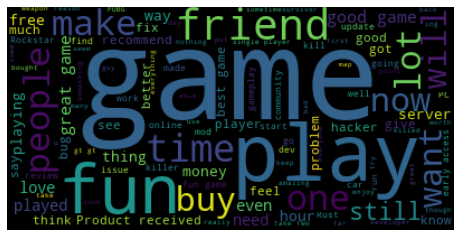

In [376]:
stopwords = set(STOPWORDS)
stopwords.update(["br","href"])
text = " ".join(review for review in dfr.review)
wordcloud = WordCloud(stopwords=stopwords).generate(text)

plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.savefig('Image09-GeneralWordCloud.pdf')
plt.show()

#### Adding the sentiment column

In [377]:
dfr2 = dfr
dfr2.loc[dfr2['recommendation'] == 'Recommended', 'sentiment'] = 'Positive'
dfr2.loc[dfr2['recommendation'] == 'Not Recommended', 'sentiment'] = 'Negative'
dfr2.head()

,date_posted,funny,helpful,hour_played,is_early_access_review,recommendation,review,title,sentiment
0,2019-02-10,2,4,578,False,Recommended,&gt Played as German Reich&gt Declare war on B...,Expansion - Hearts of Iron IV: Man the Guns,Positive
1,2019-02-10,0,0,184,False,Recommended,yes.,Expansion - Hearts of Iron IV: Man the Guns,Positive
2,2019-02-07,0,0,892,False,Recommended,Very good game although a bit overpriced in my...,Expansion - Hearts of Iron IV: Man the Guns,Positive
3,2018-06-14,126,1086,676,False,Recommended,Out of all the reviews I wrote This one is pro...,Dead by Daylight,Positive
4,2017-06-20,85,2139,612,False,Recommended,Disclaimer I survivor main. I play games for f...,Dead by Daylight,Positive


#### Splitting the dataframe into Positive reviews and Negative reviews

In [378]:
positive = dfr2[dfr2['sentiment'] == "Positive"]
negative = dfr2[dfr2['sentiment'] == "Negative"]
negative.head()

,date_posted,funny,helpful,hour_played,is_early_access_review,recommendation,review,title,sentiment
13,2016-11-03,0,0,228,False,Not Recommended,Amount of bugs and glitches from error during ...,Dead by Daylight,Negative
22,2018-04-16,0,0,250,False,Not Recommended,i would not recommend this.. this game used to...,Dead by Daylight,Negative
33,2016-08-17,0,0,0,False,Not Recommended,I couldn't even start a gamewith My friends. O...,Dead by Daylight,Negative
34,2018-04-02,0,0,178,False,Not Recommended,The game is completely unbalanced it doesn't m...,Dead by Daylight,Negative
41,2017-09-03,0,0,169,False,Not Recommended,this game is dog s hit,Dead by Daylight,Negative


#### Updating Stopwords and visualizing the most used words in positive reviews

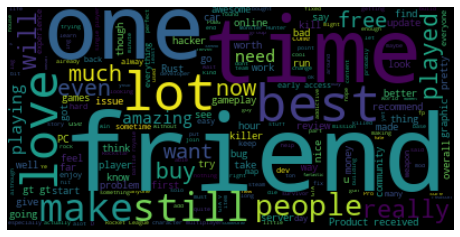

In [379]:
# Words such as "game", "play", "good", and "fun" are also used in both positive and negative reviews so we will remove them.
stopwords = set(STOPWORDS)
stopwords.update(["br","href","game", "play", "fun", "good", "great"])

pos = " ".join(review for review in positive.review)
wordcloud2 = WordCloud(stopwords=stopwords).generate(pos)

plt.imshow(wordcloud2, interpolation="bilinear")
plt.axis("off")
plt.savefig('Image10-PositiveWordCloud.pdf')
plt.show()

#### Visualizing the most used words in negative reviews

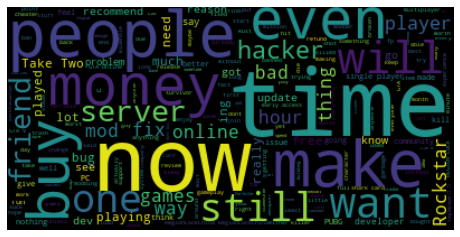

In [380]:
neg = "".join(review for review in negative.review)
wordcloud3 = WordCloud(stopwords=stopwords).generate(neg)

plt.imshow(wordcloud3, interpolation="bilinear")
plt.axis("off")
plt.savefig('Image11-NegativeWordCloud.pdf')
plt.show()

In [89]:
#fig2 = px.histogram(dfr2, x="sentiment")
#fig2.update_traces(marker_color="indianred",marker_line_color='rgb(8,48,107)',marker_line_width=1.5)
#fig2.update_layout(title_text='Sentiment')
#fig2.show()

#### Removing punctuations from reviews and creating a new dataframe with only review and sentiment column

In [47]:
def remove_punct(text):
    nopunct = "".join(u for u in text if u not in ("?", ".", ";", ":", "!", "'",'"'))
    return nopunct

dfr3 = dfr2
dfr3['review'] = dfr3['review'].apply(remove_punct)
dfr4 = dfr3[['review','sentiment']]
dfr4.head()

,review,sentiment
0,&gt Played as German Reich&gt Declare war on B...,Positive
1,yes,Positive
2,Very good game although a bit overpriced in my...,Positive
3,Out of all the reviews I wrote This one is pro...,Positive
4,Disclaimer I survivor main I play games for fu...,Positive


#### Splitting the data into train and test sets (70/30)

In [73]:
index = dfr4.index
dfr4['number'] = np.random.randn(len(index))
trainset = dfr4[dfr4['number'] <= 0.7]
testset = dfr4[dfr4['number'] > 0.7]
dfr4.head()

,review,sentiment,number
0,&gt Played as German Reich&gt Declare war on B...,Positive,-0.736883
1,yes,Positive,-0.317112
2,Very good game although a bit overpriced in my...,Positive,-1.071709
3,Out of all the reviews I wrote This one is pro...,Positive,0.912518
4,Disclaimer I survivor main I play games for fu...,Positive,1.951005


#### Importing CountVectorizer and creating a Bag of Words

In [74]:
from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer(token_pattern=r'\b\w+\b')

train_matrix = vectorizer.fit_transform(trainset['review'])
test_matrix = vectorizer.transform(testset['review'])

#### Importing Logistic Regression model

In [78]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(solver="liblinear", max_iter=1000)

#### Splitting variables

In [79]:
x_train = train_matrix
x_test = test_matrix
y_train = trainset['sentiment']
y_test = testset['sentiment']

#### Fitting the model on the data

In [80]:
lr.fit(x_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

#### Making predictions

In [81]:
predictions = lr.predict(x_test)

#### Importing confusion matrix and classification report

In [82]:
from sklearn.metrics import confusion_matrix, classification_report

new = np.asarray(y_test)
confusion_matrix(predictions, y_test)

array([[21209,  4330],
       [10846, 69085]], dtype=int64)

#### Checking accuracy of model

In [83]:
print(classification_report(predictions,y_test))

              precision    recall  f1-score   support

    Negative       0.66      0.83      0.74     25539
    Positive       0.94      0.86      0.90     79931

    accuracy                           0.86    105470
   macro avg       0.80      0.85      0.82    105470
weighted avg       0.87      0.86      0.86    105470

